<a href="https://colab.research.google.com/github/Rushi0070/Dog_Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐕 End-to-End Muliticlass Dog-Breed  classification

This notebook builds an end to end multiclass image classifier usings TensorFlow and TensorFlow Hub

In [2]:
import tensorflow as tf

import tensorflow_hub as hub

print("version of tensor flow -" ,tf.__version__)
print(" ")
print("version of tenorflow hub -",hub.__version__)


version of tensor flow - 2.15.0
 
version of tenorflow hub - 0.16.1


In [3]:
#checking for GPU availability

print("GPU" ,"available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "Not available")


GPU available (YES!!!!!)


# __Getting our data ready__

In [4]:
import pandas as pd
import matplotlib.pyplot as plt


lables_csv=pd.read_csv("/content/drive/MyDrive/dog-breed-identification/labels.csv")

In [5]:
print(lables_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [6]:
# As we have 120 breed of dogs we can say that we have 120 different classes to identify
lables_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [7]:
lables_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

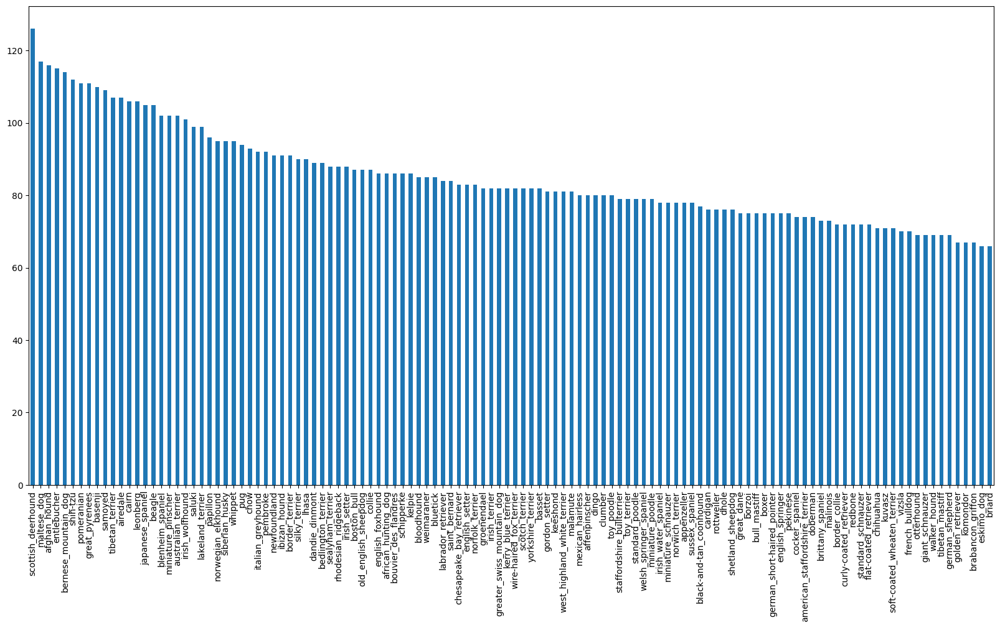

In [8]:
# we can see that the scottish deerhound has max images in our data set and briard has least

# it might happend that our model would be better at prediciting scottish deerhound then briard

lables_csv.breed.value_counts().plot.bar(figsize=(20,10))


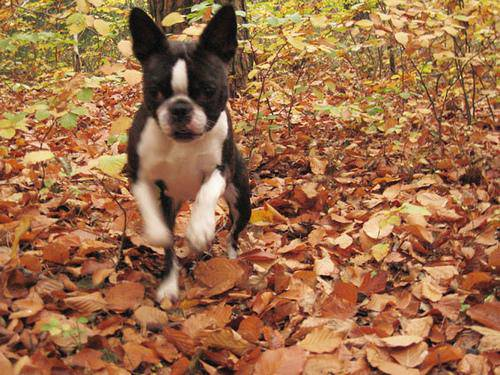

In [9]:
#displaying an image form dataset

from IPython.display import Image

Image("/content/drive/MyDrive/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")


In [10]:
# CREATING FILES PATHS FOR IMAGES
file_path=[]
for i in lables_csv["id"]:
  t="/content/drive/MyDrive/dog-breed-identification/train/"+i+".jpg"
  file_path.append(t)
file_path[:10]

['/content/drive/MyDrive/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# cross checking that number of file path are equal to the number images in training data set
import os

if(len(os.listdir("/content/drive/MyDrive/dog-breed-identification/train"))==(len(file_path))):
  print("Number of lables matches with number of images in training data")
else:
  print("data inconsistent ")

Number of lables matches with number of images in training data


In [12]:
len(os.listdir("/content/drive/MyDrive/dog-breed-identification/train"))

10222

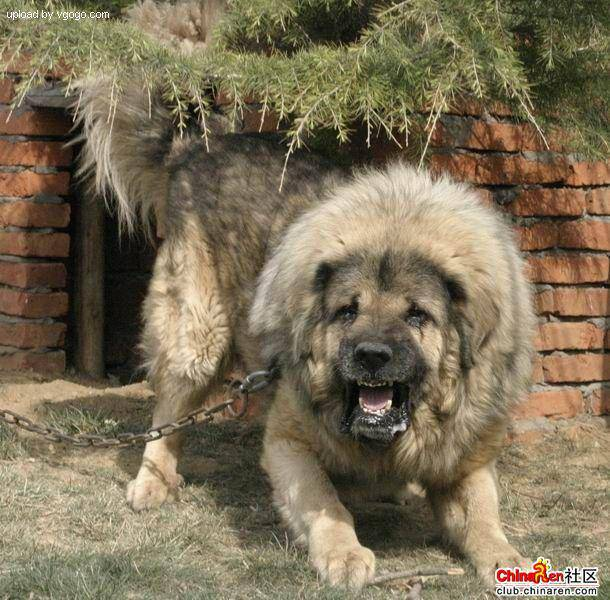

In [13]:
# Accessing images using the filepath that we have
Image(file_path[9000])



In [14]:
labels=lables_csv.breed.to_numpy()

In [15]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
# Now we will try to convert this breeds into numbers

# we will creates new columns for each breed

# put a boolean value =true for that particular breed and false for the rest of the columns
import numpy as np
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [17]:
len(unique_breeds)

120

In [18]:
# Turning one label into array of boolens

labels[2]==unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Creating boolean array for each lable

# boolean_array=[]
# for i in range(len(breeds)):
#   k=(breeds[0]==unique_breeds)
#   boolean_array.append(k)
# print(boolean_array[:2])
boolean_array= [label ==unique_breeds for label in labels]

In [20]:
# Now turning this boolean array into numbers

print(boolean_array[2].astype(int))

print("")
print(boolean_array[2].argmax())


[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]

85


In [21]:
# creating a validation set

X = file_path
y = boolean_array

In [22]:
# we have 10,000 images in our dataset  we'll create a batch of 1000 images
#experiment with it and eventually increase the batch size if the results are not good enough

NUM_IMG = 1000


In [23]:
# Spliting out data into training and valdiation set

from sklearn.model_selection import train_test_split

X_train,X_val, y_train,y_val=train_test_split(X[:NUM_IMG],y[:NUM_IMG],test_size=0.2)

In [24]:
len(X_train),len(X_val),len(y_val),len(y_train)

(800, 200, 200, 800)

# __Turning image into tensors__


In [25]:
from matplotlib.pyplot import imread

image=imread(X[1000])
type(image)

numpy.ndarray

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [27]:
image[:2]  #converted a image into a numpy array

array([[[101, 102,  97],
        [104, 105, 100],
        [107, 108, 103],
        ...,
        [117, 131,  96],
        [117, 131,  96],
        [118, 132,  97]],

       [[104, 105, 100],
        [105, 106, 101],
        [108, 109, 104],
        ...,
        [119, 133, 100],
        [122, 133, 103],
        [120, 134, 101]]], dtype=uint8)

In [28]:
image.shape # here (375,500) length width and the 3 stands for RGB

(375, 500, 3)

In [29]:
# Now converting numpy array into tensor

tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[101, 102,  97],
        [104, 105, 100],
        [107, 108, 103],
        ...,
        [117, 131,  96],
        [117, 131,  96],
        [118, 132,  97]],

       [[104, 105, 100],
        [105, 106, 101],
        [108, 109, 104],
        ...,
        [119, 133, 100],
        [122, 133, 103],
        [120, 134, 101]]], dtype=uint8)>

In [30]:
# Creating a function to automate image transformation into tensors

#defining image size
IMG_SIZE=224

def process_image(image_path,img_size=IMG_SIZE):

  # reads the image
  image = tf.io.read_file(image_path)

  # Turning jpeg into tensor with three colour channels (RGB)
  image = tf.image.decode_jpeg(image ,channels=3)

  # normalizing tensor values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resizing images to (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image



In [31]:
type(X)

list


## __BATCHES__ __IN__ __TENSORFLOW__



 1] Turing dataset into batches

 2] what is a batch -essentialy its a small chunk of dataset

 3] why do we need it  - We have around 10k images so the GPU might not be able to handle and process all that in one go

 We will take our batch size as 32 tensorflow model work with a tensor __tuple__

 `(image,label)`









In [32]:
# creating a funtion which return that tuple pair

# def gives_tuple_pair(image_path, label):
#     # Cast image_path to a string tensor
#     image_path = tf.cast(image_path, tf.string)
#     return process_image(image_path), label

def gives_tuple_pair(image_path,label):

  image = process_image(image_path)

  return image,label



In [33]:
gives_tuple_pair(X[2],y[2])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3918853 , 0.3918853 , 0.36051273],
         [0.43775532, 0.43775532, 0.40638277],
         [0.44351017, 0.44351017, 0.41213763],
         ...,
         [0.05796662, 0.02239764, 0.01937653],
         [0.05252095, 0.0470589 , 0.04978992],
         [0.04586835, 0.05371149, 0.04978992]],
 
        [[0.38653433, 0.38261276, 0.3630049 ],
         [0.4161569 , 0.41223532, 0.39262748],
         [0.43315482, 0.42923325, 0.4096254 ],
         ...,
         [0.0909924 , 0.05177672, 0.04754004],
         [0.03035708, 0.02489503, 0.02762605],
         [0.02370449, 0.03154762, 0.02762605]],
 
        [[0.36859885, 0.36467728, 0.34506944],
         [0.35422263, 0.35030106, 0.33069322],
         [0.39899355, 0.39507198, 0.3754641 ],
         ...,
         [0.2361781 , 0.20233706, 0.19541305],
         [0.04896353, 0.04268564, 0.04582458],
         [0.04459034, 0.04705883, 0.04582458]],
 
        ...,
 
        [[0.7591447 , 0.75522316

In [34]:
# Creating a function that converts our data into batches

BATCH_SIZE=32

def create_data_batches(X , y=None,batch_size=BATCH_SIZE,valid_data=False,test_batch=False):
  if test_batch:
    print("Creating test batches ")

    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only images

    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

    # if its validation data we dont need to shuffle it (why?)

  elif valid_data:
    print("creating data batch for validation data")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))

    data_batch = data.map(gives_tuple_pair).batch(BATCH_SIZE)

    return data_batch

  # we shuffle (usually you try to shuffle the data when it is in a small format)
  # example it is eaiser to shuffle the file path then the image itself
  else:
    print("creating data batch for training data")

    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))

    data=data.shuffle(buffer_size=len(X))

    data= data.map(gives_tuple_pair)

    data_batch = data.batch(BATCH_SIZE)

    return data_batch




In [35]:
train_batch =create_data_batches(X_train,y_train)

valid_batch=create_data_batches(X_val,y_val,valid_data=True)

creating data batch for training data
creating data batch for validation data


In [36]:
type(train_batch)

tensorflow.python.data.ops.batch_op._BatchDataset

In [37]:
train_batch

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

# **Building our model**

-Here we'll use the techinque of transfer learning to implement our model

__`Tranfer learning`__ Using pretrained model (on similar task)
and twick (this twicking is also know as __`finetuning`__) them for our use so we dont have to train a model from scratch


We will be using this model from tensor flowhub-https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification


In [38]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"


In [39]:
#creating a function which builds model using keras

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print ("Building a model using keras...")

  #setup the model
  model= tf.keras.Sequential([hub.KerasLayer(MODEL_URL),
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                    activation="softmax")])

  #
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                      optimizer=tf.keras.optimizers.Adam(),
                      metrics=["accuracy"])

  model.build(INPUT_SHAPE)

  return model

In [40]:
model=create_model()

model.summary()

Building a model using keras...
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# **Creating  callbacks**

call backs are helper fucntions used during training of model to check its progress,save its progress ,stop training early if the model stops improving













we will create two callbacks

1.   one for tesnorboard for logs
     (a call back which saves log files into a directory )
      and pass it to `fit()` function
2.   another for early stoppage







## **Tensorboard callback**

In [41]:
%load_ext tensorboard

In [42]:
import datetime

def create_tensorboard_callback():

  #creating a log directory to store tensorboard logs

  logdir = os.path.join("drive/MyDrive/dog-breed-identification/logs",
                        # we want to give time info whenever this callback occurs
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

## **Early Stopping callback**

In [43]:
# Early stopping  might help to overcome overfitting problem


 `patience = 3`
the parameter will get monitored till three epoch if itstill
reamins the same then this function automatically gets called to stop the training

In [44]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

#**Training  our model**

In [45]:
NUM_EPOCH = 100 #@param{type:"slider",min:10,max:100}

In [46]:
print("GPU avialable -" if tf.config.list_physical_devices("GPU") else print("GPU not available"))

GPU avialable -


In [47]:
def train_model():

  #creating the model
  model = create_model()

  # call back for tensorboard
  tensorboard=create_tensorboard_callback()

  # Fit the model passing it the data and callback we created
  model.fit(x=train_batch,
            epochs=NUM_EPOCH,
            validation_data=valid_batch,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [48]:
model = train_model()

Building a model using keras...
Epoch 1/100
25/25 [==============================] - 183s 7s/step - loss: 4.5857 - accuracy: 0.0850 - val_loss: 3.2922 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6002 - accuracy: 0.7200 - val_loss: 1.9798 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 3s 112ms/step - loss: 0.5417 - accuracy: 0.9413 - val_loss: 1.5745 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 3s 128ms/step - loss: 0.2416 - accuracy: 0.9912 - val_loss: 1.4148 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 5s 198ms/step - loss: 0.1402 - accuracy: 0.9962 - val_loss: 1.3581 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 111ms/step - loss: 0.0952 - accuracy: 1.0000 - val_loss: 1.3090 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 3s 114ms/step - loss: 0.0720 - accuracy: 1.0000 - val_loss

# **Checking the logs using TensorBoard Visualization**

In [49]:
%tensorboard --logdir drive/My\ Drive/dog-breed-identification/logs

<IPython.core.display.Javascript object>

In [50]:
predictions = model.predict(valid_batch)

7/7 [==============================] - 1s 88ms/step


In [51]:
predictions

array([[1.3007030e-03, 1.0370654e-03, 7.7162324e-05, ..., 4.7562933e-03,
        2.2209548e-05, 6.7283181e-05],
       [1.3477616e-05, 2.0737246e-04, 4.3077234e-05, ..., 1.3815684e-03,
        3.5267644e-02, 1.5573803e-05],
       [1.7274042e-04, 1.0993450e-04, 9.6571742e-04, ..., 3.7406222e-03,
        3.5894240e-04, 2.0003194e-05],
       ...,
       [6.1149703e-04, 7.0462120e-05, 1.6175976e-05, ..., 1.5181352e-05,
        4.6180314e-05, 8.9482681e-05],
       [6.5381842e-05, 6.6289140e-05, 5.3264212e-05, ..., 2.2177026e-06,
        1.6694014e-07, 1.8549825e-04],
       [7.5609045e-04, 1.6156888e-03, 7.4671210e-05, ..., 1.3025899e-02,
        7.2640935e-03, 3.6823156e-04]], dtype=float32)

In [52]:
len(predictions)

200

In [53]:
predictions.shape  # 200 data samples and output is a array of  120 length(120 different breeds) with each number givings us the probabilty of that class

(200, 120)

This array consits of 120 probability value each corresopnding to each breed we will find the max probabilty in these [120 values] and that will be output of our model

In [54]:
n=9
print(f" prdiction on sample {n}")
print("")
print(f"the array {predictions[n]}")
print("")
print(f"sum of one array should be equals to one = {sum(predictions[n])}")
print("")
print(f"The max value {np.argmax(predictions[n])}")

 prdiction on sample 9

the array [6.1868624e-05 2.1915529e-02 8.7736867e-04 4.9215169e-03 1.6571981e-05
 1.4471008e-03 2.4262939e-02 3.6137312e-04 1.3072262e-04 2.3626110e-04
 1.1228299e-04 5.2844302e-04 8.0438011e-04 4.0460982e-05 2.8760996e-01
 2.2453002e-03 2.6810546e-03 3.3214032e-03 1.5187927e-03 1.1637659e-05
 2.2254232e-04 1.7103128e-04 9.5077395e-04 2.6405204e-02 1.5775392e-04
 2.1031110e-03 6.4373022e-04 2.1208716e-03 1.3012688e-04 9.3688897e-05
 1.1546974e-03 2.6137155e-05 3.0116740e-04 7.9307280e-04 7.5045886e-05
 1.0912742e-04 8.8692615e-03 2.0885831e-03 2.5259724e-03 4.9119342e-02
 3.5508670e-04 9.9577359e-05 4.8332196e-04 3.1163855e-03 4.7034216e-03
 1.3653161e-04 6.8072654e-02 2.5331046e-05 8.9407877e-05 3.3771619e-04
 1.0477906e-02 1.2440104e-03 8.9983857e-04 1.4027694e-03 1.5981324e-03
 1.4772480e-03 5.9765703e-03 2.4762510e-03 1.8952962e-04 3.9952074e-04
 1.0164812e-04 5.5557404e-05 4.4086145e-04 7.4786409e-03 2.6117160e-04
 1.9678766e-04 7.7034538e-03 1.1515807e-03 

In [55]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [56]:
pred_label = get_pred_label(predictions[4])

In [57]:
pred_label

'basenji'

In [58]:
# def unbatchify(data):

#   images=[]
#   labels=[]

#   for image,label in data.unbatch().as_numpy_iterator():
#     images.append(image)
#     labels.append(label)
#     return images,labels

val_images=[]
val_labels=[]

for image ,label in valid_batch.unbatch().as_numpy_iterator():
  val_images.append(image)
  val_labels.append(unique_breeds[np.argmax(label)])


In [59]:
val_images[5],val_labels[5]

(array([[[0.64705884, 0.627451  , 0.36862746],
         [0.60085785, 0.58125   , 0.31531864],
         [0.57953435, 0.55330884, 0.28664216],
         ...,
         [0.6229167 , 0.62806374, 0.32156864],
         [0.6192402 , 0.6317402 , 0.32083336],
         [0.6156863 , 0.63529414, 0.3137255 ]],
 
        [[0.6435049 , 0.6238971 , 0.36507353],
         [0.6069662 , 0.58735836, 0.32142693],
         [0.59563804, 0.5694126 , 0.29674864],
         ...,
         [0.64312965, 0.6482767 , 0.34777883],
         [0.63345593, 0.6459559 , 0.33504903],
         [0.629902  , 0.64950985, 0.32794118]],
 
        [[0.629902  , 0.61029416, 0.34485295],
         [0.60935587, 0.589748  , 0.32319623],
         [0.61178005, 0.58555454, 0.31227025],
         ...,
         [0.6569049 , 0.6686696 , 0.3654833 ],
         [0.6385455 , 0.65704274, 0.34375766],
         [0.63799024, 0.6575981 , 0.34264708]],
 
        ...,
 
        [[0.67242646, 0.66102946, 0.41151965],
         [0.48551247, 0.46534163, 0.23648

In [60]:
get_pred_label(val_labels[5])

'affenpinscher'

In [61]:
def plot_pred(prediction_probabilities,labels,images, n=1):
  pred_prob ,true_label ,image =prediction_probabilities[n],labels[n],images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label ==true_label:
    colour="green"
  else:
    colour="red"

  plt.title ("[prediction={}]  {:2.0f}%  [true_label={}]".format(pred_label,np.max(pred_prob)*100,true_label),color=colour)

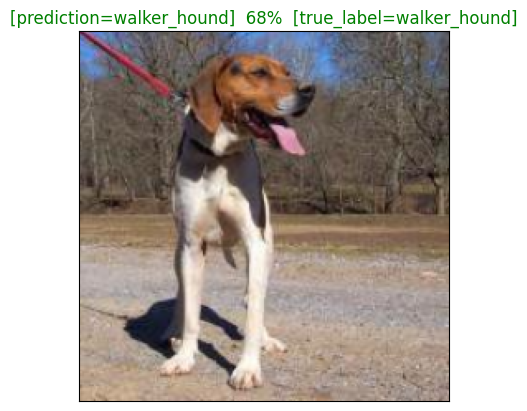

In [62]:
plot_pred(predictions,val_labels,val_images)

In [63]:
# Now creating a functio for visualizing top 10 predictons

def plot_pred_conf(predictions_probabilities,labels, n=1):

  pred_prob,true_label=predictions_probabilities[n],labels[n]

  pred_label = get_pred_label(pred_prob)

  # finding top 10 predicition indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # finding top 10 values
  top_10_pred_value = pred_prob[top_10_pred_indexes]

  #finding their labels
  top_10_pred_label = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_label)),top_10_pred_value,color='grey')
  plt.xticks(np.arange(len(top_10_pred_label)),labels=top_10_pred_label,rotation='vertical')

  # plot the correct label in green
  if np.isin(true_label ,top_10_pred_label):
    top_plot[np.argmax(top_10_pred_label==true_label)].set_color("green")
  else:
    pass


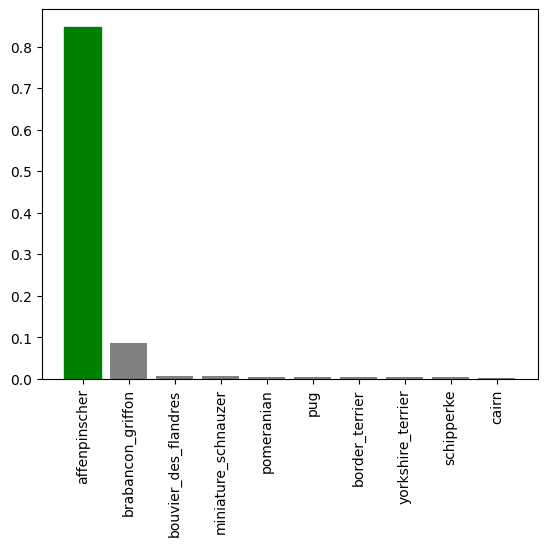

In [64]:
plot_pred_conf(predictions,val_labels,n=6)

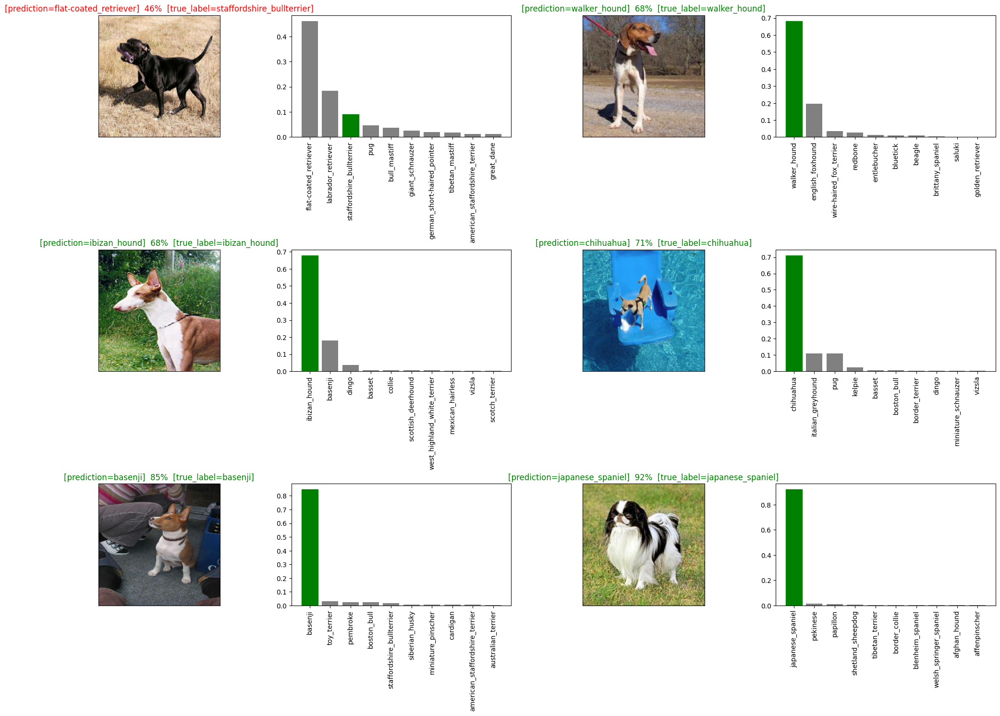

In [79]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# **Saving and Realoding model**

In [65]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [66]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [70]:
#  Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240309-05391709962777-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20240309-05391709962777-1000-images-mobilenetv2-Adam.h5'

In [72]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20240309-05391709962753-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240309-05391709962753-1000-images-mobilenetv2-Adam.h5


In [76]:
model.evaluate(valid_batch)

7/7 [==============================] - 2s 194ms/step - loss: 1.1926 - accuracy: 0.6800


[1.1925852298736572, 0.6800000071525574]

In [77]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(valid_batch)

7/7 [==============================] - 1s 73ms/step - loss: 1.1926 - accuracy: 0.6800


[1.1925852298736572, 0.6800000071525574]

# **Training   model  (on the full data)**

In [80]:
len(X), len(y)

(10222, 10222)

In [81]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

creating data batch for training data


In [82]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [83]:
# Create a model for full model
full_model = create_model()

Building a model using keras...


In [84]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [85]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=5,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/5
320/320 [==============================] - 1653s 5s/step - loss: 1.3224 - accuracy: 0.6723
Epoch 2/5
320/320 [==============================] - 33s 103ms/step - loss: 0.4032 - accuracy: 0.8795
Epoch 3/5
320/320 [==============================] - 35s 110ms/step - loss: 0.2358 - accuracy: 0.9358
Epoch 4/5
320/320 [==============================] - 33s 104ms/step - loss: 0.1537 - accuracy: 0.9634
Epoch 5/5
320/320 [==============================] - 36s 113ms/step - loss: 0.1050 - accuracy: 0.9795


In [86]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20240309-06191709965163-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240309-06191709965163-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
#loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20200205-07041580886291-full-image-set-mobilenetv2-Adam')

In [1]:

!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 41.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.7/310.7 kB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 92.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 7.8 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.2-py3-none-any.whl size

In [102]:
import gradio as gr

def classify_image(image):
  # Preprocess the image
  image = tf.image.resize(image, (224, 224))
  image = image / 255.0

  # Make predictions
  predictions = full_model.predict(np.expand_dims(image, axis=0))

  # Get the predicted label
  predicted_label = unique_breeds[np.argmax(predictions)]

  # Return the predicted label
  return predicted_label

image_input = gr.Image()
label_output = gr.Label()

interface = gr.Interface(fn=classify_image, inputs=image_input, outputs=label_output)

interface.launch()


Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://d5a2bcffd790f97205.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
